##### S240132

## RBGL Model Proposal: ASL Fingerspelling Classification &#x1F91E; &#x1F44C; &#x270B; &#x1F446;

### 1. Introduction
In this proposal, we outline the design and implementation of an RBGL (Research, Build, Generalize, and Learn) model for American Sign Language (ASL) fingerspelling classification. The objective of this project is to develop a deep learning model that lays the ground work for future development on modles that can train and run on edge devices

### 2. Exploratory Data Analysis
##### 2.0 Importing Modules

In [70]:
import os
import json
import pickle
import tqdm
#__
import pandas as pd
import numpy as np
from scipy import stats
import itertools
#__
import matplotlib.pyplot as plt
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
pd.options.plotting.backend = "plotly"
#__
import torch
import tensorflow as tf
import keras
from keras.utils import to_categorical
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.layers import Embedding, LSTM, GRU, Dense, Dropout, TimeDistributed, Bidirectional, SimpleRNN
from keras.models import Sequential
#__
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning)
#__

##### 2.1 Load Files
asl-fingerspelling <br>
├── character_to_prediction_index.json <br>
├── supplemental_landmarks <br>
│   └── 1032110484.parquet <br>
│   └── 1047404576.parquet <br>
│   └── ...  <br>
├── supplemental_metadata.csv <br>
├── train.csv <br>
├── train_landmarks <br>
│   └── 1019715464.parquet <br>
│   └── 1021040628.parquet <br>
│   └── ... <br>
├── ohec_processed.pkl <br>
├── processed_data.pkl <br>

In [71]:
# Define file paths
load_train = 'train.csv'
load_dict = 'character_to_prediction_index.json'
sign_p_data = 'sign_processed.pkl'
ohec_p_data = 'ohec_processed.pkl'


# Check for files if exists and load
files_to_check = [load_train, load_dict, sign_p_data, ohec_p_data]
loaded_files = []

for file in files_to_check:
    if os.path.isfile(file):
        loaded_files.append(file)
        print(f'{file}: loaded')
    else:
        print(f'{file} not found')

# Load sign_processed.pkl if available
if sign_p_data in loaded_files:
    sign_p = True
    with open(sign_p_data, 'rb') as file:
        sign_processed = pickle.load(file)
else:
    sign_p = False

# Load ohec_processed.pkl if available
if ohec_p_data in loaded_files:
    ohec_p = True
    with open(ohec_p_data, 'rb') as file:
        ohec_processed = pickle.load(file)
else:
    ohec_p = False

# Load main DataFrame from train.csv
if load_train in loaded_files:
    main = pd.read_csv(load_train)

# Load character_to_prediction_index.json
if load_dict in loaded_files:
    with open(load_dict) as dataFile:
        charData = json.load(dataFile)

print('-loading complete-')

train.csv: loaded
character_to_prediction_index.json: loaded
sign_processed.pkl: loaded
ohec_processed.pkl: loaded
-loading complete-


##### 2.1 Data Exploration

The main dataframe has:<br>
<b>path</b>: Has information on parquet file paths and names <br>
<b>file_id</b>:Shows the id that is used in path<br>
<b>sequence_id</b>:Sequence of signed phrase<br>
<b>participant_id</b>:Participant id<br>
<b>phrase</b>:The phrase that is being signed in sequence_id

In [72]:
#Find n of unique file_ids
print('____________________________\n')
print('Longest length of phrase [max_len]:',max_len)
print('Number of classes [n_classes]:',n_classes)
print('Number of unique file_id:', len(main['file_id'].unique()))
print('Number of Sequences:', len(main))
print('\n____________________________')

____________________________

Longest length of phrase [max_len]: 31
Number of classes [n_classes]: 59
Number of unique file_id: 68
Number of Sequences: 67287

____________________________


In [73]:
#Assign temporary variable names for data exploration
temp_fid = main['file_id'][0]
temp_p = f'train_landmarks/{temp_fid}.parquet'
temp_s = pd.read_parquet(temp_p)

In [74]:
temp_s.head(5)

,frame,x_face_0,x_face_1,x_face_2,x_face_3,x_face_4,x_face_5,x_face_6,x_face_7,x_face_8,...,z_right_hand_11,z_right_hand_12,z_right_hand_13,z_right_hand_14,z_right_hand_15,z_right_hand_16,z_right_hand_17,z_right_hand_18,z_right_hand_19,z_right_hand_20
sequence_id,,,,,,,,,,,,,,,,,,,,,
1816796431,0,0.710588,0.699951,0.705657,0.691768,0.699669,0.701980,0.709724,0.610405,0.712660,...,-0.245855,-0.269148,-0.129743,-0.251501,-0.278687,-0.266530,-0.152852,-0.257519,-0.275822,-0.266876
1816796431,1,0.709525,0.697582,0.703713,0.691016,0.697576,0.700467,0.709796,0.616540,0.713729,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1816796431,2,0.711059,0.700858,0.706272,0.693285,0.700825,0.703319,0.711549,0.615606,0.715143,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1816796431,3,0.712799,0.702518,0.707840,0.694899,0.702445,0.704794,0.712483,0.625044,0.715677,...,-0.370770,-0.408097,-0.185217,-0.325494,-0.343373,-0.328294,-0.203126,-0.315719,-0.326104,-0.314282
1816796431,4,0.712349,0.705451,0.709918,0.696006,0.705180,0.706928,0.712685,0.614356,0.714875,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [75]:
import re

patterns = {
    'Right hand': ['x_right_hand', 'y_right_hand', 'z_right_hand'],
    'Left hand': ['x_left_hand', 'y_left_hand', 'z_left_hand'],
    'Face': ['x_face', 'y_face', 'z_face'],
    'Pose': ['x_pose', 'y_pose', 'z_pose']
}
print('____________________________\n')
for label, pattern in patterns.items():
    count = len(temp_s.filter(regex='|'.join(pattern)).columns)
    print(label + ' col:', count)
print('\n____________________________')

____________________________

Right hand col: 63
Left hand col: 63
Face col: 1404
Pose col: 99

____________________________


##### 2.2 Visualisation

In [76]:
#To visualise the data, we will have to convert it to the older format that mediapipe uses
def map_new_to_old_style(sequence):
    types = []
    landmark_indexes = []
    for column in list(sequence.columns)[1:544]:
        parts = column.split("_")
        if len(parts) == 4:
            types.append(parts[1] + "_" + parts[2])
        else:
            types.append(parts[1])

        landmark_indexes.append(int(parts[-1]))

    data = {
        "frame": [],
        "type": [],
        "landmark_index": [],
        "x": [],
        "y": [],
        "z": []
    }

    for index, row in sequence.iterrows():
        data["frame"] += [int(row.frame)]*543
        data["type"] += types
        data["landmark_index"] += landmark_indexes

        for _type, landmark_index in zip(types, landmark_indexes):
            data["x"].append(row[f"x_{_type}_{landmark_index}"])
            data["y"].append(row[f"y_{_type}_{landmark_index}"])
            data["z"].append(row[f"z_{_type}_{landmark_index}"])

    return pd.DataFrame.from_dict(data)

# assign desired colors to landmarks
def assign_color(row):
    if row == 'face':
        return 'red'
    elif 'hand' in row:
        return 'dodgerblue'
    else:
        return 'green'

# specifies the plotting order
def assign_order(row):
    if row.type == 'face':
        return row.landmark_index + 101
    elif row.type == 'pose':
        return row.landmark_index + 30
    elif row.type == 'left_hand':
        return row.landmark_index + 80
    else:
        return row.landmark_index

#Creates lines between points
def visualise2d_landmarks(parquet_df, title=""):
    connections = [       #[0 is the thumb]
        [0, 1, 2, 3, 4,],  #[1-4 is thumb finger]
        [0, 5, 6, 7, 8],    #[5-8 index finger]
        [0, 9, 10, 11, 12],  #[9-12 middle finger]
        [0, 13, 14, 15, 16],  #[13-16 ring finger]
        [0, 17, 18, 19, 20],   #[17-20 is pinky]

        
        [38, 36, 35, 34, 30, 31, 32, 33, 37],
        [40, 39],
        [52, 46, 50, 48, 46, 44, 42, 41, 43, 45, 47, 49, 45, 51],
        [42, 54, 56, 58, 60, 62, 58],
        [41, 53, 55, 57, 59, 61, 57],
        [54, 53],

        
        [80, 81, 82, 83, 84, ],
        [80, 85, 86, 87, 88],
        [80, 89, 90, 91, 92],
        [80, 93, 94, 95, 96],
        [80, 97, 98, 99, 100], ]

    parquet_df = map_new_to_old_style(parquet_df)
    frames = sorted(set(parquet_df.frame))
    first_frame = min(frames)
    parquet_df['color'] = parquet_df.type.apply(lambda row: assign_color(row))
    parquet_df['plot_order'] = parquet_df.apply(lambda row: assign_order(row), axis=1)
    first_frame_df = parquet_df[parquet_df.frame == first_frame].copy()
    first_frame_df = first_frame_df.sort_values(["plot_order"]).set_index('plot_order')


    frames_l = []
    for frame in frames:
        filtered_df = parquet_df[parquet_df.frame == frame].copy()
        filtered_df = filtered_df.sort_values(["plot_order"]).set_index("plot_order")
        traces = [go.Scatter(
            x=filtered_df['x'],
            y=filtered_df['y'],
            mode='markers',
            marker=dict(
                color=filtered_df.color,
                size=9))]

        for i, seg in enumerate(connections):
            trace = go.Scatter(
                    x=filtered_df.loc[seg]['x'],
                    y=filtered_df.loc[seg]['y'],
                    mode='lines',
            )
            traces.append(trace)
        frame_data = go.Frame(data=traces, traces = [i for i in range(17)])
        frames_l.append(frame_data)

    traces = [go.Scatter(
        x=first_frame_df['x'],
        y=first_frame_df['y'],
        mode='markers',
        marker=dict(
            color=first_frame_df.color,
            size=9
        )
    )]
    for i, seg in enumerate(connections):
        trace = go.Scatter(
            x=first_frame_df.loc[seg]['x'],
            y=first_frame_df.loc[seg]['y'],
            mode='lines',
            line=dict(
                color='black',
                width=2
            )
        )
        traces.append(trace)
        
    fig = go.Figure(
        data=traces,
        frames=frames_l
    )


    fig.update_layout(
        width=500,
        height=1000,
        scene={
            'aspectmode': 'data',
        },
        updatemenus=[
            {
                "buttons": [
                    {
                        "args": [None, {"frame": {"duration": 100,
                                                  "redraw": True},
                                        "fromcurrent": True,
                                        "transition": {"duration": 0}}],
                        "label": "&#9654; Play",
                        "method": "animate",
                    },

                ],
                "direction": "left",
                "font": {"size": 18},
                "type": "buttons",
                "xanchor": "left",
                "yanchor": "top",
                "x": 0.4,
                "y": 0,
            }
        ],
    )
    camera = dict(
        up=dict(x=0, y=-1, z=0),
        eye=dict(x=0, y=0, z=2.5)
    )
    
    fig.update_layout(
        title = {
            'text': f'<b>{title}</b>',
            'y': 0.97,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font_size': 24
        },
        scene_camera=camera,
        showlegend=False,
        margin = dict(t = 20, b = 20, l = 20, r = 20),
        xaxis = dict(visible=False),
        yaxis = dict(visible=False),
        template = "plotly_white",
    )
    
    fig.update_yaxes(autorange="reversed")
    fig.show()


def get_phrase(df, file_id, sequence_id):
    return df[
        np.logical_and(
            df.file_id == file_id, 
            df.sequence_id == sequence_id
        )
    ].phrase.iloc[0]

In [77]:
#Visualise fingerspelling as animation
file_id = 5414471
sequence_id = 1816796431
sign = pd.read_parquet(temp_p)
sequence = sign[sign.index == sequence_id]
sequence_phrase = get_phrase(main, file_id, sequence_id)
visualise2d_landmarks(sequence, f"Phrase: {sequence_phrase}")

In [78]:
print('Top 20 Phrases and counts','\n================================')
print(main['phrase'].value_counts().head(20),'\n____________________')

Top 20 Phrases and counts 
surprise az                        17
yonkers new york                   16
fort worth tx                      16
raleigh north carolina             15
buffalo ny                         14
alexandria virginia                13
north charleston south carolina    13
honolulu hi                        12
overland park ks                   12
sugar land tx                      12
tampa fl                           11
corona california                  11
cleveland ohio                     10
houston texas                       8
allen texas                         7
6420 natl forest develop road       6
3720 gooseneck lake oo lane         4
7137 ronrick road                   4
start-deutsch                       4
3282 west cll rudolfo               4
Name: phrase, dtype: int64 
____________________


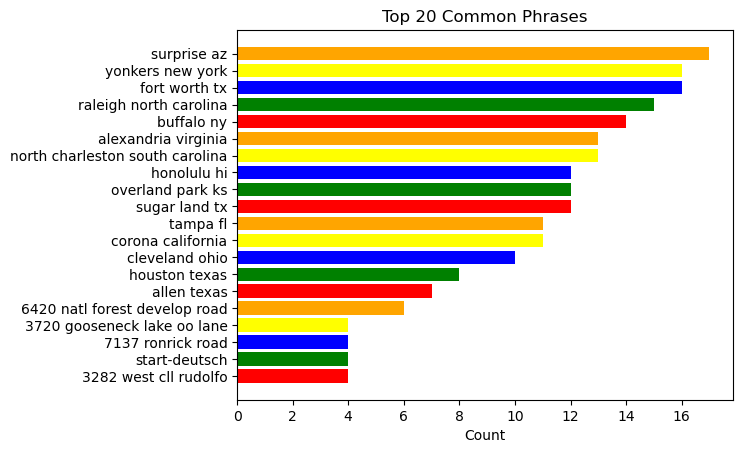

In [79]:
top_20_phrases = main['phrase'].value_counts().head(20)
top_20_phrases = top_20_phrases.iloc[::-1] # reverse the order
plt.barh(top_20_phrases.index, top_20_phrases.values, color=['red', 'green', 'blue', 'yellow', 'orange'])
plt.xlabel('Count')
plt.title('Top 20 Common Phrases')
plt.show()

### 3. Data Preprocessing
##### 3.1 Sign
We start by looping through the rows of phrases in the main DataFrame. For each row, we get the file_id, sequence_id, and the matching phrase.

Next, we call the make_signs() function. This function only takes the x and y coordinates of the right hand and drops everything else. The output of the make_signs() function is a list of tuples, where each tuple contains the x and y coordinates of a hand gesture.

Finally, we feed the output of the make_signs() function to the create_sign_data() function. This function creates a DataFrame containing the x and y coordinates of the hand gestures, as well as the file_id, sequence_id, and the matching phrase.

In [80]:
#Pre-processing Sign
def get_data(main):
    
    limit = 2000 #Change to adjust number of created samples 
    total_iter = min(len(main), limit)
    count = 0  # Initialize a count variable
    sign_data_combined = None  # Initialize an empty DataFrame to store the combined sign data
    
    for _, row in tqdm(main.iterrows(), total=total_iter, desc='Processing'):
        if count >= limit:
            break  # Exit the loop if the count exceeds the limit
        file_id = row['file_id']
        seq_id = row['sequence_id']
        path = f'train_landmarks/{file_id}.parquet'
        
        s = pd.read_parquet(path)
        
        sign = make_sign(s)
        sign_data_combined = sign_data(sign, sign_data_combined)  # Pass the combined sign data to the sign_data function
        
        count += 1  # Increment the count variable after processing each row

    return sign_data_combined

def make_sign(s):
    col_hand = [col for j in range(0, 21) for coord in
                #Reducing dimensions// Feature extraction
                ['x_right_hand', 'y_right_hand'] for col in s.filter(like=f'{coord}_{j}')]
    sign = s[col_hand]
    sign_avg = sign.mean()
    sign = pd.DataFrame(sign_avg).transpose()
    return sign

def sign_data(sign, sign_data_combined):
    if sign_data_combined is None:
        sign_data_combined = sign
    else:
        sign_data_combined = pd.concat([sign_data_combined, sign])
    return sign_data_combined

# Call the get_data function


In [81]:
'''
If we have already processed the sign and pickled it, it would have been
loaded in an earlier cell. If file exists and loaded there is no need to
process the signs again.
'''
if sign_p == True:
    print('File already loaded')
    pass
else:
    print('Generating sign_processed')
    sign_data_combined = get_data(main)
    sign_data_seq = main['sequence_id'][:2000].tolist()
    
    pd.DataFrame(sign_data_seq)
    sign_data_combined.insert(0, 'sequence_id', sign_data_seq)
    
    sign_processed = sign_data_combined
    with open('sign_processed.pkl', 'wb') as file:
        pickle.dump(sign_processed, file)

File already loaded


##### 3.2 Preprocessing Phrase

The encode_phrases() function takes three arguments: phrases, character_dict, and max_length. The phrases argument is a list of phrases, the character_dict argument is a dictionary that maps characters to integers, and the max_length argument is the maximum length of a phrase.

The function first tokenizes the phrases by splitting them into individual characters. It then encodes the characters by looking them up in the character_dict dictionary. If the character is not in the dictionary, it is assigned the value -1.

The function then pads the encoded phrases to the same length using the pad_sequences() function. The pad_sequences() function adds padding to the end of the phrases so that they all have the same length.

Finally, the function one-hot encodes the padded phrases using the to_categorical() function. The to_categorical() function creates a new vector for each phrase, where each element in the vector represents a different character.

The ohec_processed variable is a boolean variable that indicates whether the ohec_processed.pkl file has already been generated. If the file has already been generated, the code prints the message "File already loaded". Otherwise, the code generates the ohec_processed.pkl file by first creating a phrases DataFrame containing the first 2000 phrases from the main DataFrame. The code then calls the encode_phrases() function to encode the phrases and saves the encoded phrases to the ohec_processed.pkl file.

Tokenization is the process of breaking down a string into smaller units, such as words, characters, or phrases. Tokenization is a common preprocessing step in natural language processing (NLP) tasks. In the code above, we are tokenizing the phrases into individual characters. This allows us to represent the phrases as sequences of numbers, which can be used by machine learning models.

In [82]:
def encode_phrases(phrases, character_dict, max_length):
    tk_phrases = [list(phrase) for phrase in tqdm(phrases, desc='Tokenising')] #tokenise phrases
    en_phrases = [[character_dict.get(char, -1) for char in phrase] for phrase in tqdm(tk_phrases, desc='Encoding')] #Encoding
    pa_phrases = pad_sequences(en_phrases, maxlen=max_length, padding='post') #Add padding
    oh_phrases = to_categorical(pa_phrases, num_classes=len(character_dict)) #One Hot Encoding (ohec)
    
    return oh_phrases

In [83]:
'''
Same as sign_processed, if it already is loaded do not generate new ones
'''
if ohec_p == True:
    print('File already loaded')
else:
    print('Generating ohec_processed')
    phrases = pd.Series(list(main['phrase'][0:2000]))
    encoded_phrases = encode_phrases(phrases, character_dict, max_length)
    
    with open('ohec_processed.pkl', 'wb') as file:
        pickle.dump(ohec_processed, file)

File already loaded


### 4. Training

In [84]:
X_ = sign_processed.values
y = ohec_processed

num_samples = 2000
num_features = 65
sequence_length = 31

def reshape_input_data(data, sequence_length=sequence_length, num_features=num_features):
    reshaped_data = np.zeros((data.shape[0], sequence_length, num_features // sequence_length))
    for i, sample in enumerate(data):
        reshaped_sample = sample[:sequence_length * (num_features // sequence_length)].reshape(sequence_length, -1)
        reshaped_data[i] = reshaped_sample
    return reshaped_data

X = reshape_input_data(X_)

In [85]:
from sklearn.model_selection import train_test_split

X_train, X_temp, y_train, y_temp = train_test_split(X, y, train_size=0.8, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, train_size=0.5, random_state=42)

In [86]:
total_words = 59
input_shape = 31,2
learning_rate = 0.001

def create_model(input_shape, total_words):
    model = Sequential()
    
    # Add Input Layer
    model.add(SimpleRNN(units=31, input_shape=input_shape, activation="relu", return_sequences=True))
    model.add(Bidirectional(GRU(100, return_sequences=True)))
    model.add(Dropout(0.1))
    model.add(LSTM(100, return_sequences=True))
    
    # Add Output Layer
    model.add(TimeDistributed(Dense(total_words, activation='softmax')))

    model.compile(loss='categorical_crossentropy', optimizer='adam')
    
    return model

model = create_model(input_shape, total_words, name='RBGL')
model.summary()
model.compile(loss=keras.losses.categorical_crossentropy, optimizer=keras.optimizers.Adam(learning_rate), metrics=['accuracy'])

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_1 (SimpleRNN)    (None, 31, 31)            1054      
                                                                 
 bidirectional_1 (Bidirectio  (None, 31, 200)          79800     
 nal)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 31, 200)           0         
                                                                 
 lstm_1 (LSTM)               (None, 31, 100)           120400    
                                                                 
 time_distributed_1 (TimeDis  (None, 31, 59)           5959      
 tributed)                                                       
                                                                 
Total params: 207,213
Trainable params: 207,213
Non-tr

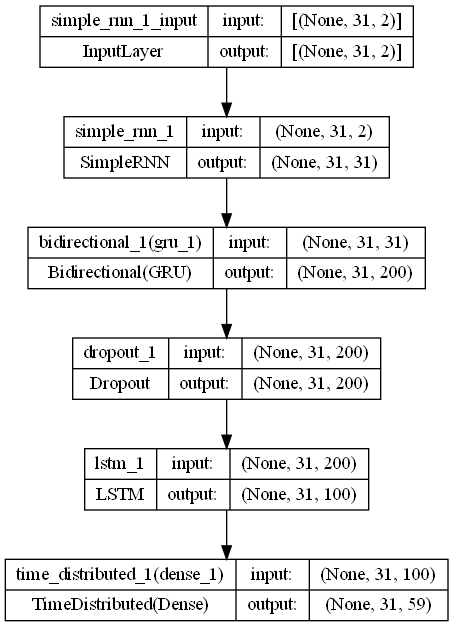

In [87]:
display(tf.keras.utils.plot_model(model, to_file='model_architecture.png', show_shapes=True))

In [88]:
%%time
import matplotlib.pyplot as plt

#Access the training history
history = model.fit(X_train, y_train, epochs=100, verbose=1, validation_data=(X_val, y_val))

Epoch 1/100
50/50 [==============================] - 10s 91ms/step - loss: 2.5752 - accuracy: 0.4401 - val_loss: 2.3015 - val_accuracy: 0.4632
Epoch 2/100
50/50 [==============================] - 3s 65ms/step - loss: 2.3374 - accuracy: 0.4529 - val_loss: 2.2823 - val_accuracy: 0.4640
Epoch 3/100
50/50 [==============================] - 5s 95ms/step - loss: 2.3278 - accuracy: 0.4533 - val_loss: 2.2798 - val_accuracy: 0.4647
Epoch 4/100
50/50 [==============================] - 5s 107ms/step - loss: 2.3269 - accuracy: 0.4532 - val_loss: 2.2749 - val_accuracy: 0.4642
Epoch 5/100
50/50 [==============================] - 4s 85ms/step - loss: 2.3229 - accuracy: 0.4539 - val_loss: 2.2784 - val_accuracy: 0.4634
Epoch 6/100
50/50 [==============================] - 4s 78ms/step - loss: 2.3195 - accuracy: 0.4535 - val_loss: 2.2732 - val_accuracy: 0.4631
Epoch 7/100
50/50 [==============================] - 4s 80ms/step - loss: 2.3163 - accuracy: 0.4522 - val_loss: 2.2719 - val_accuracy: 0.4634
Epoc

50/50 [==============================] - 5s 103ms/step - loss: 2.2857 - accuracy: 0.4626 - val_loss: 2.2450 - val_accuracy: 0.4731
Epoch 59/100
50/50 [==============================] - 5s 106ms/step - loss: 2.2857 - accuracy: 0.4636 - val_loss: 2.2458 - val_accuracy: 0.4731
Epoch 60/100
50/50 [==============================] - 4s 87ms/step - loss: 2.2853 - accuracy: 0.4637 - val_loss: 2.2473 - val_accuracy: 0.4721
Epoch 61/100
50/50 [==============================] - 4s 82ms/step - loss: 2.2841 - accuracy: 0.4630 - val_loss: 2.2468 - val_accuracy: 0.4682
Epoch 62/100
50/50 [==============================] - 5s 110ms/step - loss: 2.2837 - accuracy: 0.4641 - val_loss: 2.2489 - val_accuracy: 0.4723
Epoch 63/100
50/50 [==============================] - 5s 96ms/step - loss: 2.2832 - accuracy: 0.4649 - val_loss: 2.2451 - val_accuracy: 0.4731
Epoch 64/100
50/50 [==============================] - 5s 95ms/step - loss: 2.2831 - accuracy: 0.4642 - val_loss: 2.2460 - val_accuracy: 0.4732
Epoch 65/

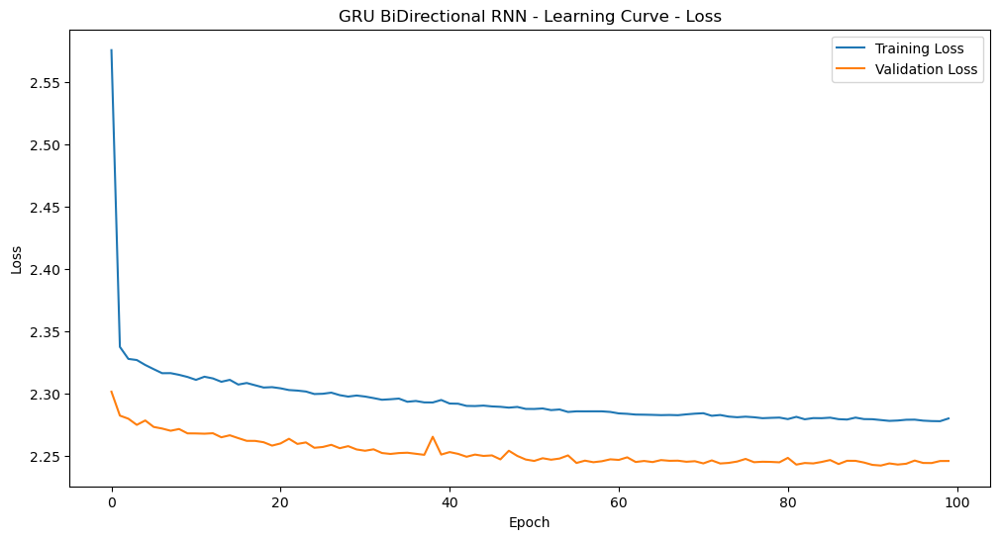

In [89]:
#Plot the learning curve
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('GRU BiDirectional RNN - Learning Curve - Loss')
plt.legend()
plt.show()

In [90]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
# Assuming you have X_test for prediction
y_test_pred = model.predict(X_test)
y_test_pred_classes = np.argmax(y_test_pred, axis=2)

# Convert true labels to class labels
y_test_classes = np.argmax(y_test, axis=2)

# Calculate accuracy
accuracy = accuracy_score(y_test_classes.ravel(), y_test_pred_classes.ravel())

# Calculate precision
precision = precision_score(y_test_classes.ravel(), y_test_pred_classes.ravel(), average='weighted', zero_division=1)

# Calculate recall
recall = recall_score(y_test_classes.ravel(), y_test_pred_classes.ravel(), average='weighted')

# Calculate F1-score
f1 = f1_score(y_test_classes.ravel(), y_test_pred_classes.ravel(), average='weighted')

print("Test Accuracy:", accuracy)
print("Test Precision:", precision)
print("Test Recall:", recall)
print("Test F1-score:", f1)


7/7 [==============================] - 2s 22ms/step
Test Accuracy: 0.46048387096774196
Test Precision: 0.6994359543010752
Test Recall: 0.46048387096774196
Test F1-score: 0.33538640645127116


### 5. Model Comparisons

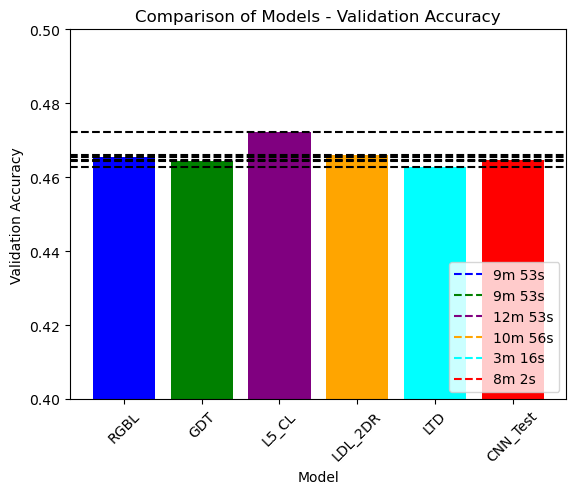

In [91]:
models = ['RGBL', 'GDT', 'L5_CL', 'LDL_2DR', 'LTD', 'CNN_Test']
val_acc = [0.4655, 0.4645, 0.4721, 0.4659, 0.4628, 0.4646]
durations = ['9m 53s', '9m 53s', '12m 53s', '10m 56s', '3m 16s', '8m 2s']

# Create a dictionary to store the model accuracies and durations
model_acc = {}
model_durations = {}

# Assign the model accuracies and durations to the dictionaries
for model, acc, duration in zip(models, val_acc, durations):
    model_acc[model] = acc
    model_durations[model] = duration

# Plot the bar chart
fig, ax = plt.subplots()

colors = ['blue', 'green', 'purple', 'orange', 'cyan', 'red']

bars = ax.bar(model_acc.keys(), model_acc.values(), color=colors)
ax.set_xlabel('Model')
ax.set_ylabel('Validation Accuracy')
ax.set_title('Comparison of Models - Validation Accuracy')
ax.set_ylim(0.4, 0.5)

# Add the duration lines
for i, (model, duration) in enumerate(model_durations.items()):
    color = colors[i]
    line_color = 'black' if color != 'black' else 'white'
    ax.axhline(model_acc[model], color=line_color, linestyle='--', label=f'{model} - {duration}')

# Set the x-axis tick labels
ax.set_xticklabels(model_acc.keys(), rotation=45)

# Set the x-axis tick positions
ax.set_xticks(range(len(model_acc)))

# Add legend for the duration lines
legend_handles = [plt.Line2D([0], [0], color=line_color, linestyle='--') for line_color in colors]
ax.legend(legend_handles, model_durations.values(), loc='lower right')

plt.show()